In [1]:
from IPython.display import Image

### twitter language classification (by KMeans)

 - 데이터 수집 > 데이터 탐색 > 학습 > 서비스 적용(추론, 예측, 분류)

-----

 - sc.version
 - sc.master
 - sc.sparkUser
 
-----
### 데이터 수집

 - create twitter directory

----

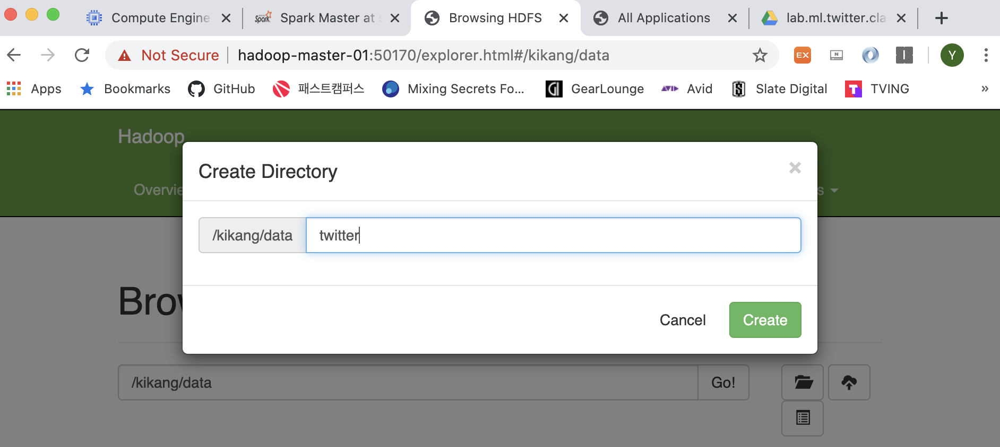

In [2]:
Image('./capture/streaming_01.png')

#### 강의자료 collect.scala file

-----
#### 트윗 수집 디렉토리 경로, 수집 트윗 개수, 스트리밍 배치 인터벌, 스트림 RDD 파티션 개수 설정....

------

In [ ]:
val Array(outputDirectory, numTweetsToCollect,  intervalSecs, partitionsEachInterval) 
      = Array("hdfs://hadoop-master-01:9000/kikang/data/twitter", "5000", "5", "1")

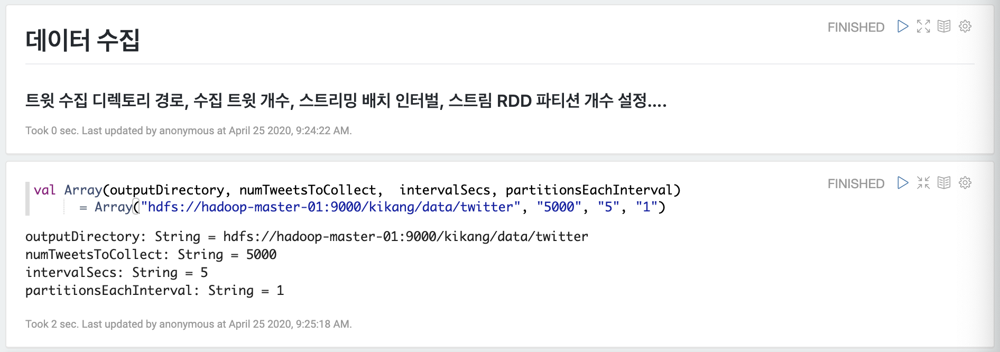

In [3]:
Image('./capture/streaming_02.png')

-----
### import


In [ ]:
import org.apache.spark.streaming.{Seconds, StreamingContext}
import org.apache.spark.streaming.twitter.TwitterUtils
import com.google.gson.Gson

------

### create streaming context 



In [ ]:
println(">>>> Initializing Streaming Spark Context....")

""" 
 val conf = new SparkConf()
  .setAppName(this.getClass.getSimpleName)
  .setMaster("local[*]")
conf.set("spark.sql.warehouse.dir", "spark-warehouse")  
val sc = new SparkContext(conf) """

val ssc = new StreamingContext(sc, Seconds(intervalSecs.toLong))

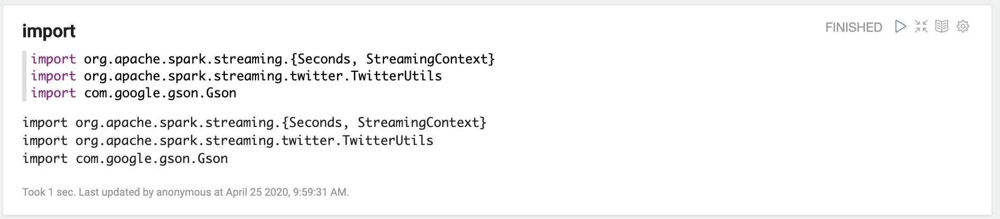

In [9]:
Image('./capture/streaming_03.png')

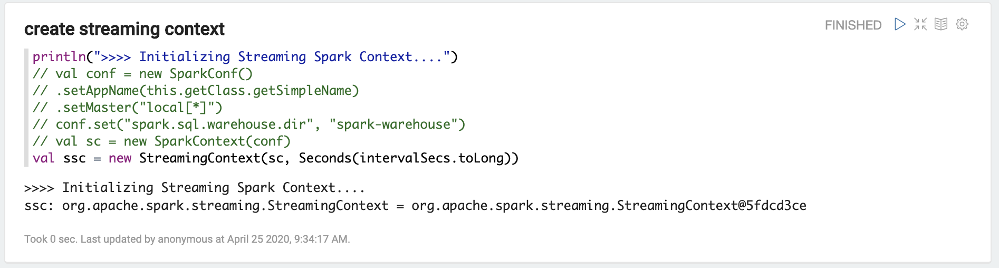

In [10]:
Image('./capture/streaming_03_01.png')

-----
### utils

 - object 안에 필요한 import 모아둠 
 
#### 강의자료 utils.scala 파일에서 복사


In [ ]:
object Utils {

    import org.apache.spark.mllib.linalg.Vector
    import org.apache.spark.mllib.feature.HashingTF
    import twitter4j.auth.OAuthAuthorization
    import twitter4j.conf.ConfigurationBuilder

 def getAuth = {   
    //--트위터 계정 + 트위터 App (with Consumer Key and Access Token) 필요....
    val Array(consumerKey, consumerSecret, accessToken, accessTokenSecret) = Array("edgWhFgM9GML1TfA7hvzALTE9", "Jssdq2Kt1RDR3P0hG0GvpFvtjMg0JkG7LMR8qsq3ZhW8Wv9OVS", "168871039-RZ0pUTk1Ixzju4Dv0hmr6w1b0Mt7shlvHLnClqaO", "cICFbap5aoOQW2WB7Jpd0HwKL1viFv5BCg9pM8UMbWTkB")

    val builder: ConfigurationBuilder = new ConfigurationBuilder()
    builder.setOAuthConsumerKey(consumerKey);
    builder.setOAuthConsumerSecret(consumerSecret);
    builder.setOAuthAccessToken(accessToken);
    builder.setOAuthAccessTokenSecret(accessTokenSecret);
    Some(new OAuthAuthorization(builder.build()))
  }

"""
* Create feature vectors by turning each tweet into bigrams of characters (an n-gram model)
* and then hashing those to a length-1000 feature vector that we can pass to MLlib.
* This is a common way to decrease the number of features in a model while still
* getting excellent accuracy (otherwise every pair of Unicode characters would
* potentially be a feature).
"""

  val numFeatures = 1000
  val tf = new HashingTF(numFeatures)

  def featurize(s: String): Vector = {
    tf.transform(s.sliding(2).toSeq)  //--transform()....Transforms the input document into a sparse term frequency vector.
  }
}

-----
- 암호화 할 때의 키와 복호화 할 때의 키가 같으면 대칭키 아니면 비대칭키 
- Array key는 본인 twitter api key

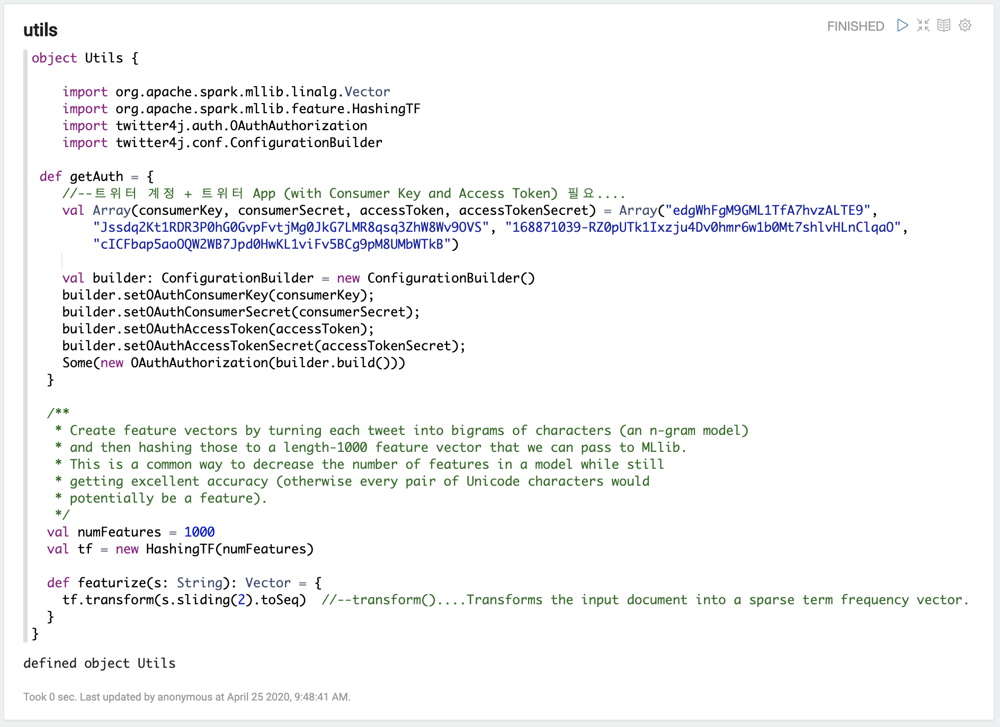

In [6]:
Image('./capture/streaming_04.png')

-----
### create twitter stream (디버깅)


In [ ]:
println(">>>> Initializing Twitter stream....")
    val tweetInputDStream = TwitterUtils.createStream(ssc, Utils.getAuth)

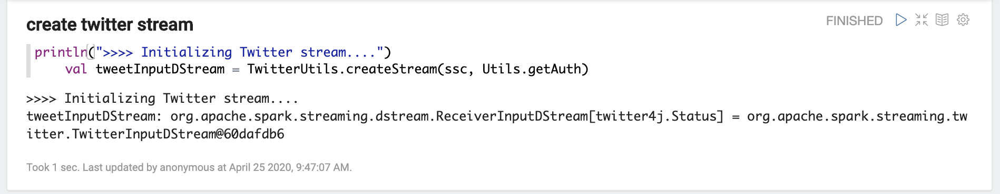

In [7]:
Image('./capture/streaming_05.png')

-----
### print twitter stream
 
 - 각각의 executor 에서 출력됨 
 - foreach : action


In [ ]:
tweetInputDStream.foreachRDD((rdd, time) => 
  rdd.foreach { status => 
    println(s">>>> status (@ ${time.milliseconds}) : ${status}")
    println(s">>>> status.getText (@ ${time.milliseconds}) : ${status.getText}")
  }
)

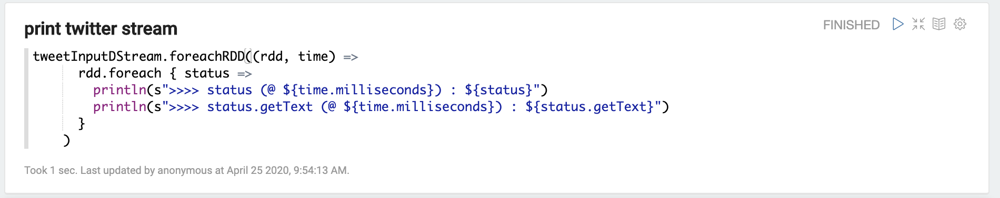

In [8]:
Image('./capture/streaming_06.png')

-----
### create twitter JSON stream

- 트위터 Status 객체를 JSON 스트링으로 트랜스폼 \
 -> 향후 Spark SQL로 분석하기 위해 로딩 및 쿼리가 용이한 JSON 형태로 변형


In [ ]:
var gson = new Gson()\
val tweetStream = tweetInputDStream.map(gson.toJson(_))

  --> 이 상태로 실행하면 Task not serializable 이라는 에러 발생
 
------

#### 코드 수정



In [ ]:
val tweetStream = tweetInputDStream.map{status =>
    var gson = new Gson()
    gson.toJson(status)
}

 - 객체 선언은 부하가 많이 걸릴 수 있음 

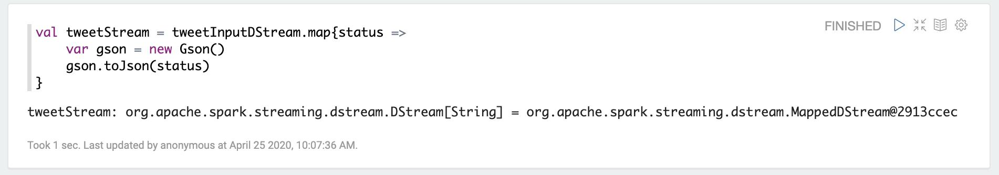

In [11]:
Image('./capture/streaming_07.png')

-----
### 수집한 twitter json string을 HDFS에 배치 , interval (5s) 간격으로 directory 생성 후 저장 + 5000개 넘으면 ssc stop



In [ ]:
var numTweetsCollected = 0L 

tweetStream.foreachRDD((rdd, time) => {
  val count = rdd.count()
  if (count > 0) {  //--해당 스트림 배치 인터벌에 데이터가 있을 경우....
    //--파티션 별로 파일이 생성됨....=> 적절한 파일 개수를 위해 파티션 조정(리파티션)....
    val outputRDD = rdd.repartition(partitionsEachInterval.toInt)
    //--RDD 내용을 파일로 저장....
    outputRDD.saveAsTextFile(outputDirectory + "/tweets_" + time.milliseconds.toString)
    //--수집된 트윗 개수 누적....
    numTweetsCollected += count
    //--수집된 트윗 개수를 수집하고자 하는 트윗 개수 목표치와 비교하여 요건 만족시 트윗 수집 종료(스트리밍 앱 종료)....  
    if (numTweetsCollected >= numTweetsToCollect.toLong) {
      println(s">>>> numTweetsCollected : ${numTweetsCollected}")
    //   System.exit(0)
        ssc.stop(false, true)
    }
  }
})


----- 
- System.exit(0) : 시스템 전체가 exit 되기 때문에 streaming context 만 down 시키는 코드추가
 
-----
### ssc stop



In [ ]:
ssc.start()
// ssc.awaitTermination()

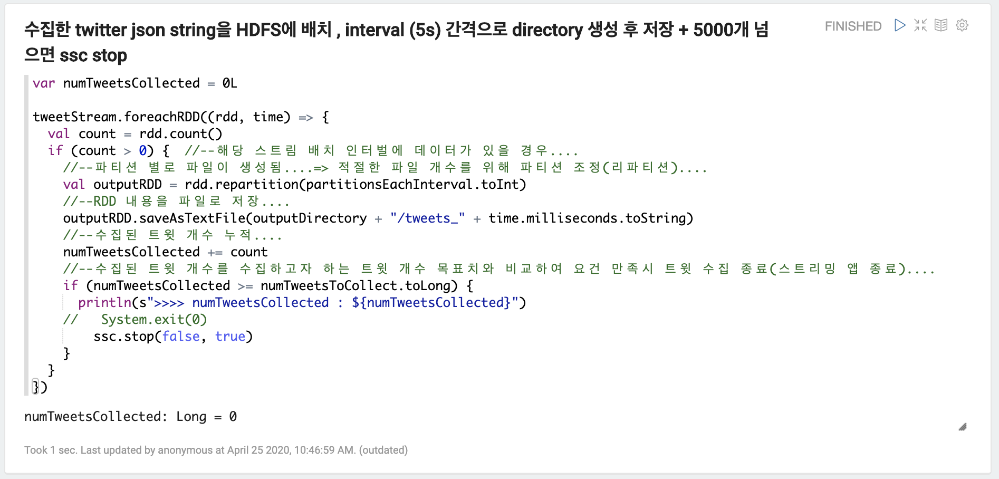

In [12]:
Image('./capture/streaming_08.png')

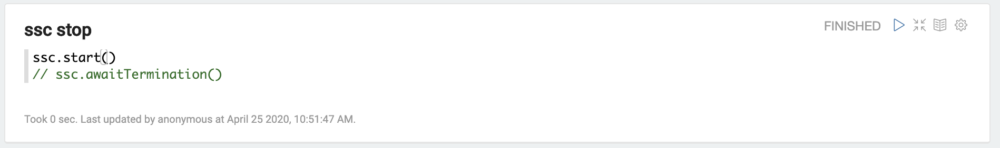

In [13]:
Image('./capture/streaming_09.png')

### HDFS 에서 확인

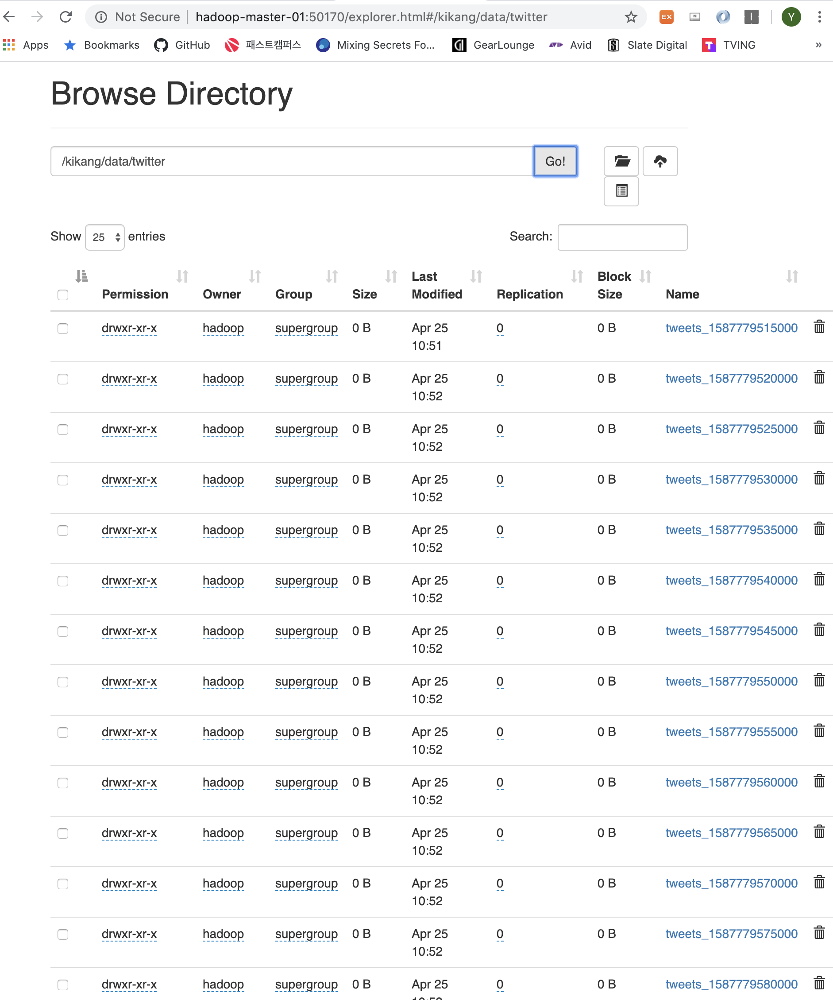

In [14]:
Image('./capture/streaming_10.png')

----
## 데이터 탐색

 ### 변수 선언


In [ ]:
val Array(tweetInput) 
      = Array("hdfs://hadoop-master-01:9000/kikang/data/twitter" + "/tweets_*/part-*")

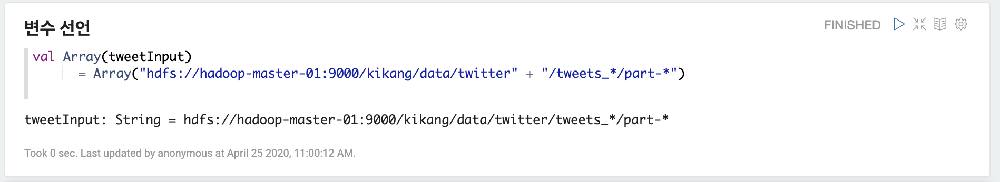

In [15]:
Image('./capture/streaming_11.png')

----
###  Pretty print some of the tweets


In [ ]:
import com.google.gson.{GsonBuilder, JsonParser}

val jsonParser = new JsonParser()
val gson = new GsonBuilder().setPrettyPrinting().create()

val tweets = sc.textFile(tweetInput)
println(">>>> ----------- Sample JSON Tweets -----------")
val take = tweets.take(5)
println(s">>>> take.length : ${take.length} \n")
for (tweet <- tweets.take(5)) {
  println(s">>>> Pretty print : ${gson.toJson(jsonParser.parse(tweet))}")
  println(s">>>> Raw print : ${tweet} \n")
}
println(s"\n")

------
 - jsonParser : json parsing(객체형태)
 - gson에서 PrettyPrinting 할 수 있게 설정

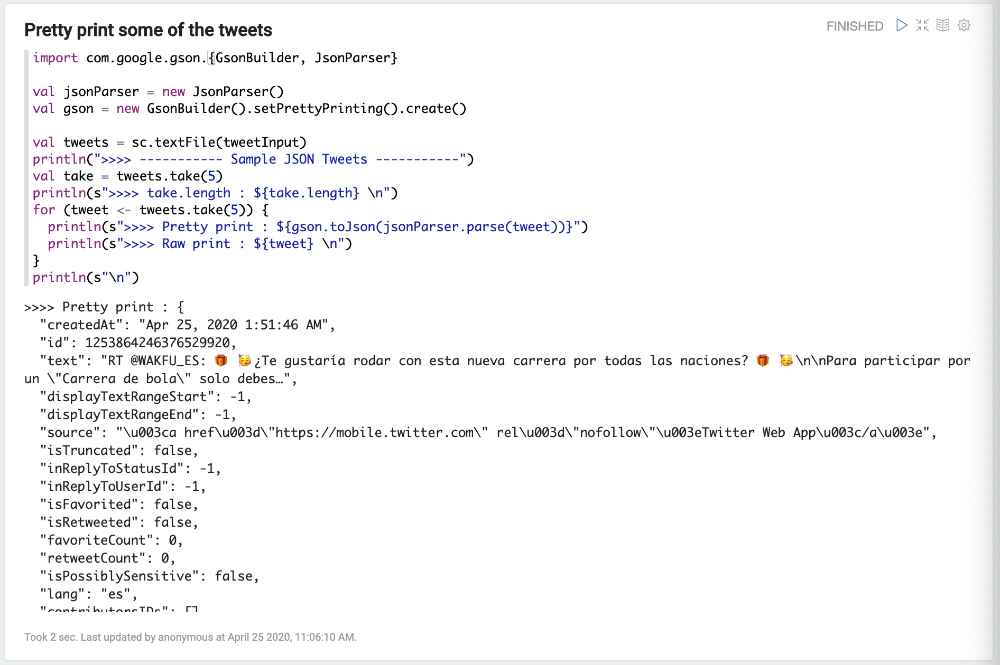

In [16]:
Image('./capture/streaming_12.png')

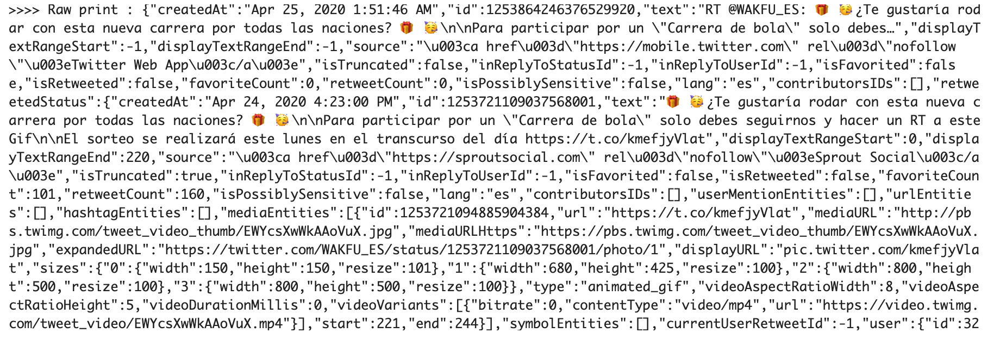

In [17]:
Image('./capture/streaming_13.png')

-----
#### Spark SQL로 json은 후 캐시 -> 결과는 Dataset  


In [ ]:
val tweetTable = spark
    .read
    .json(tweetInput)
    .cache()

------
#### create TempView 



In [ ]:
tweetTable.createOrReplaceTempView("tweetTable")

-----
#### print schema

    

In [ ]:
println(">>>> ----------- Tweet Table Schema -----------")
tweetTable.printSchema()
println(s"\n")

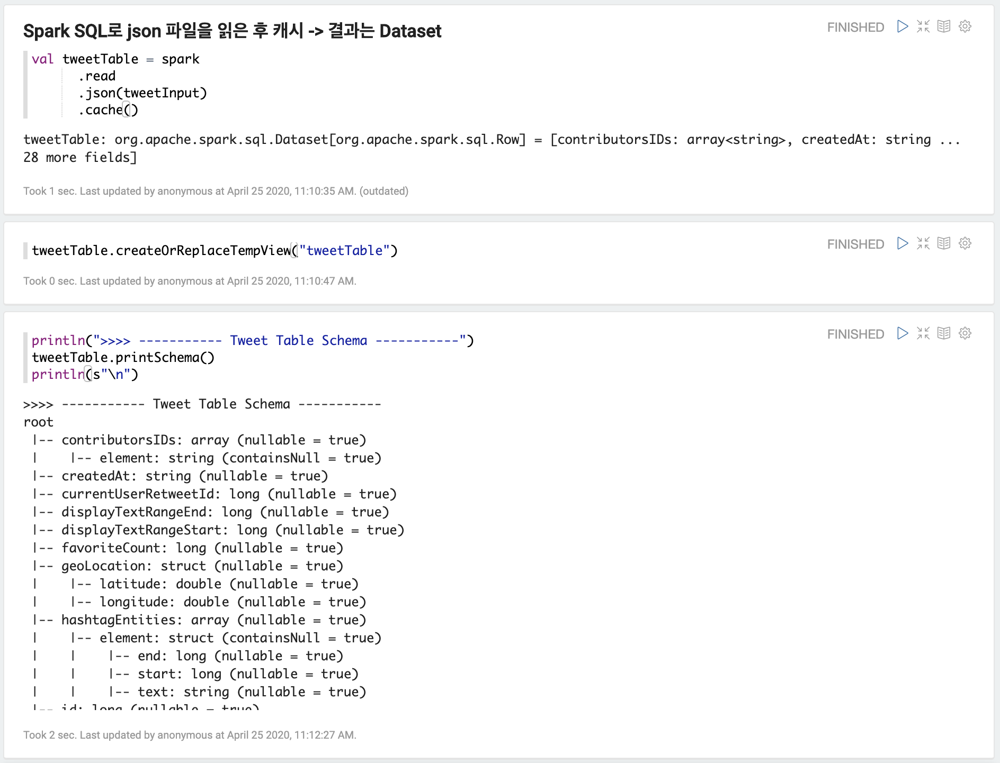

In [18]:
Image('./capture/streaming_14.png')

-----
#### SQL : sample twitter 


In [ ]:
%sql
SELECT text FROM tweetTable LIMIT 10

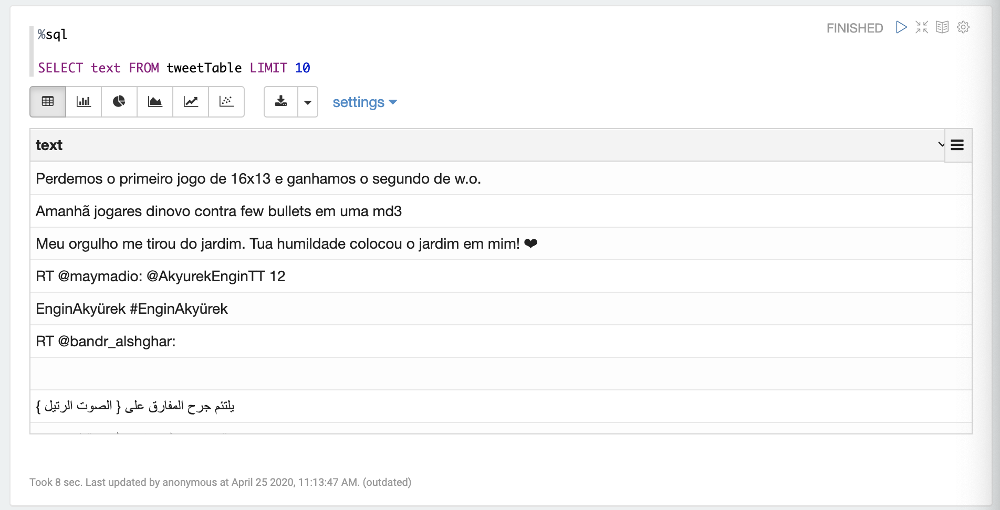

In [19]:
Image('./capture/streaming_15.png')

In [ ]:
%sql

SELECT 
    replace(text, '\n', ' ') as text 
FROM 
    tweetTable 
LIMIT 10

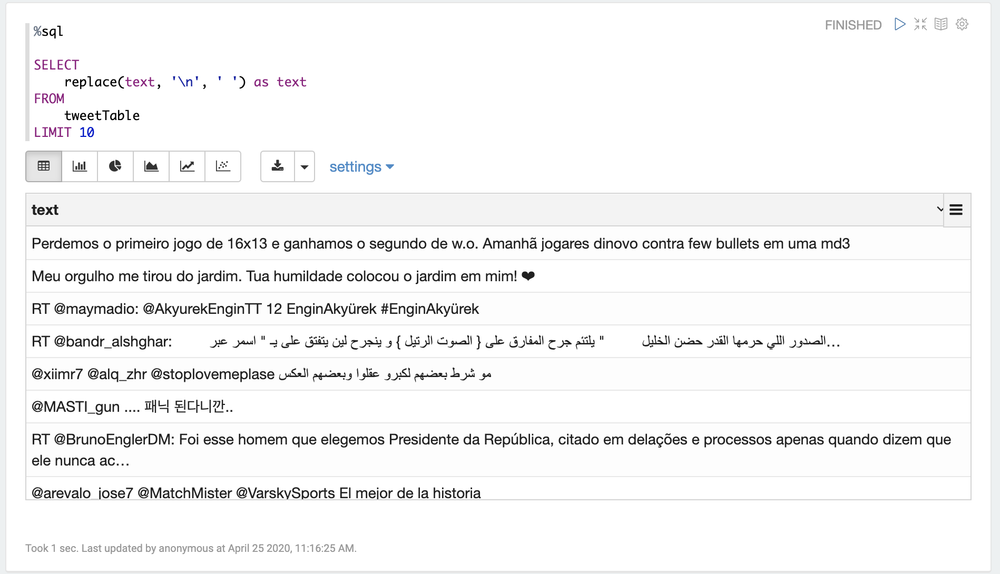

In [20]:
Image('./capture/streaming_16.png')

----

 - user 정보와 관련된 하위정보까지 출력

In [ ]:
%sql

SELECT 
    replace(text, '\n', ' ') as text 
    ,user
FROM 
    tweetTable 
LIMIT 10

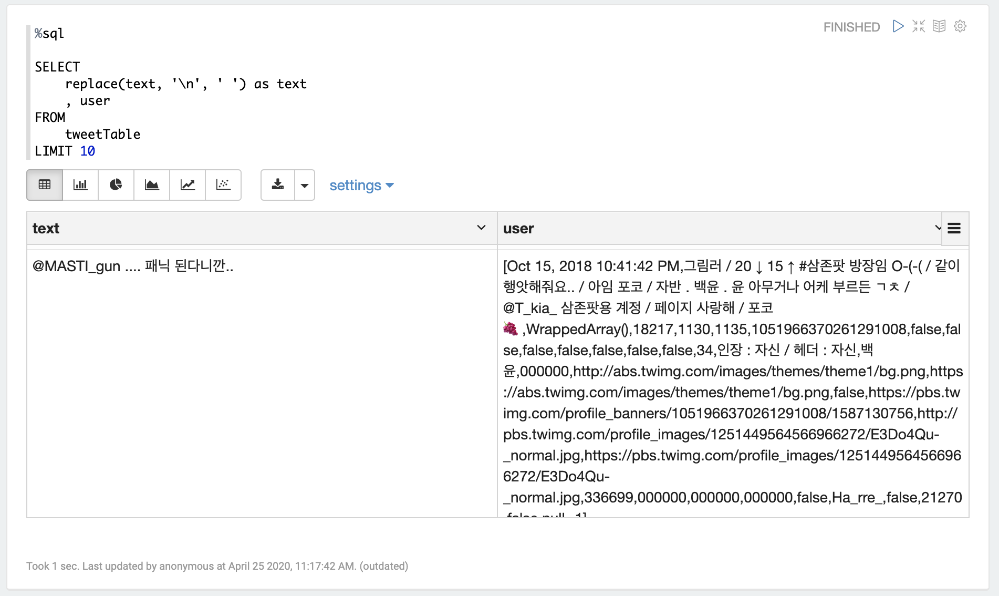

In [21]:
Image('./capture/streaming_17.png')

-----


In [ ]:
%sql

SELECT 
    replace(text, '\n', ' ') as text 
    , user.createdAt
    , lang
FROM 
    tweetTable 
LIMIT 10

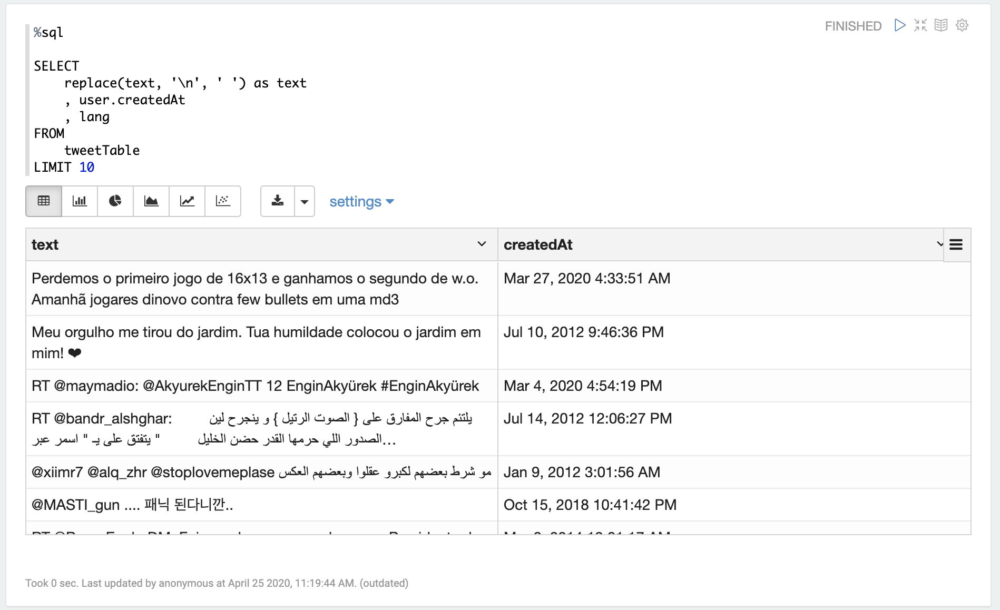

In [22]:
Image('./capture/streaming_18.png')

----

In [ ]:
%sql

SELECT 
    count(*)
FROM 
    tweetTable 

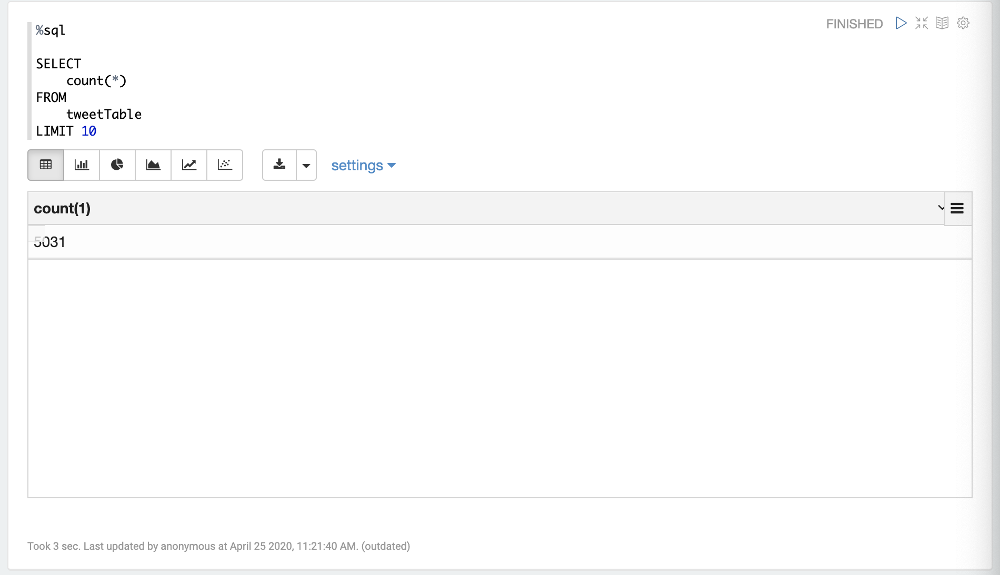

In [23]:
Image('./capture/streaming_19.png')

----

In [ ]:
%sql

SELECT 
    distinct(lang)
FROM 
    tweetTable 

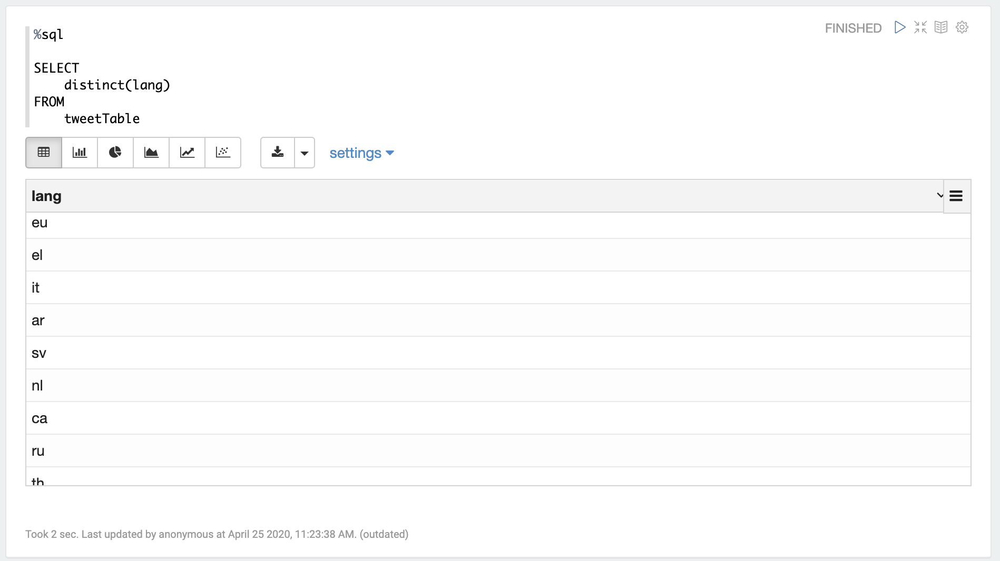

In [25]:
Image('./capture/streaming_20.png')

----
    

In [ ]:
%sql

SELECT 
    count(distinct(lang))
FROM 
    tweetTable

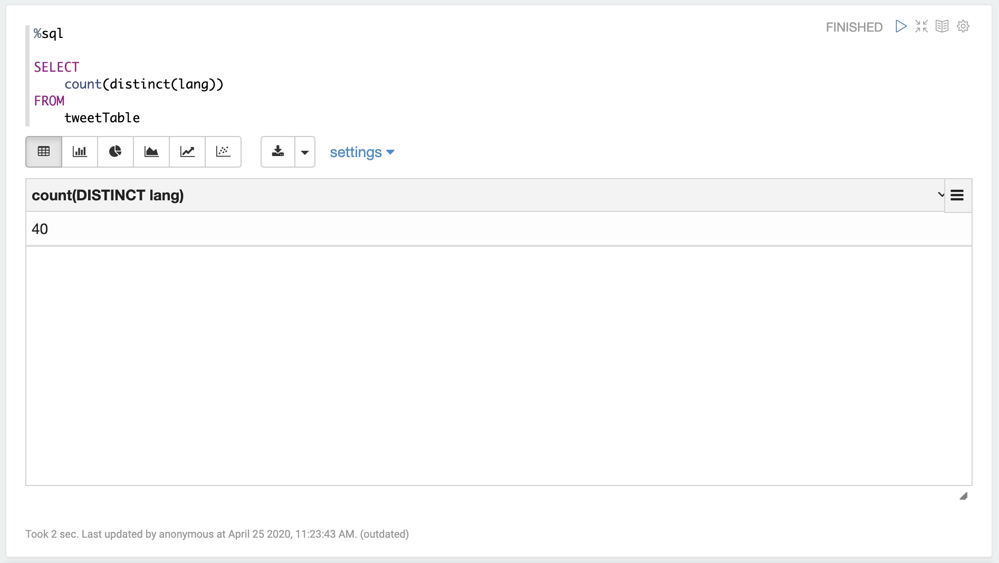

In [27]:
Image('./capture/streaming_21.png')

-----
    

In [ ]:
%sql

SELECT 
    distinct(lang) as lang
FROM 
    tweetTable 
order by lang

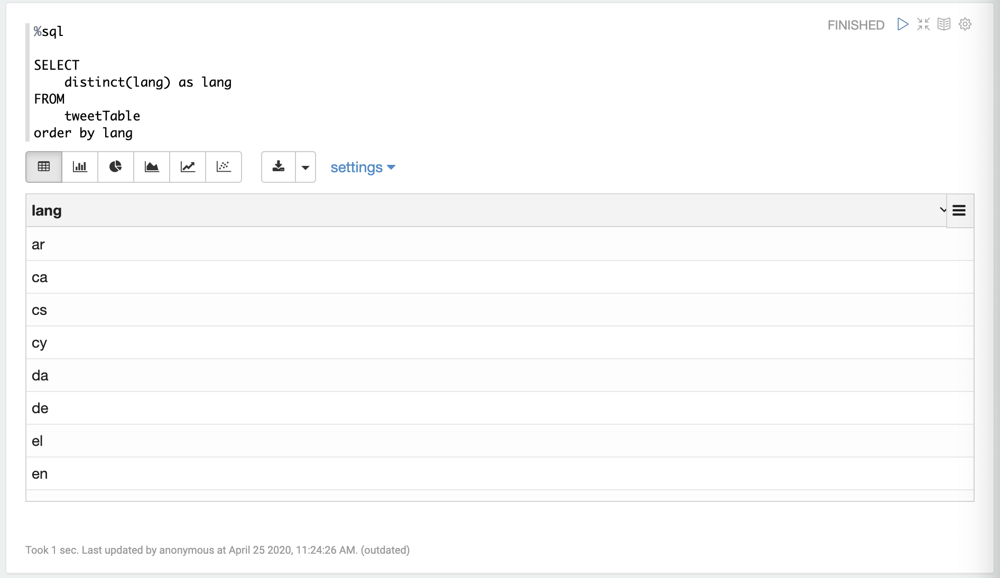

In [28]:
Image('./capture/streaming_22.png')

----
    

In [ ]:
%sql

SELECT
    lang
    , count(lang) as cnt
FROM
    TweetTable
group by lang
order by cnt desc, lang asc

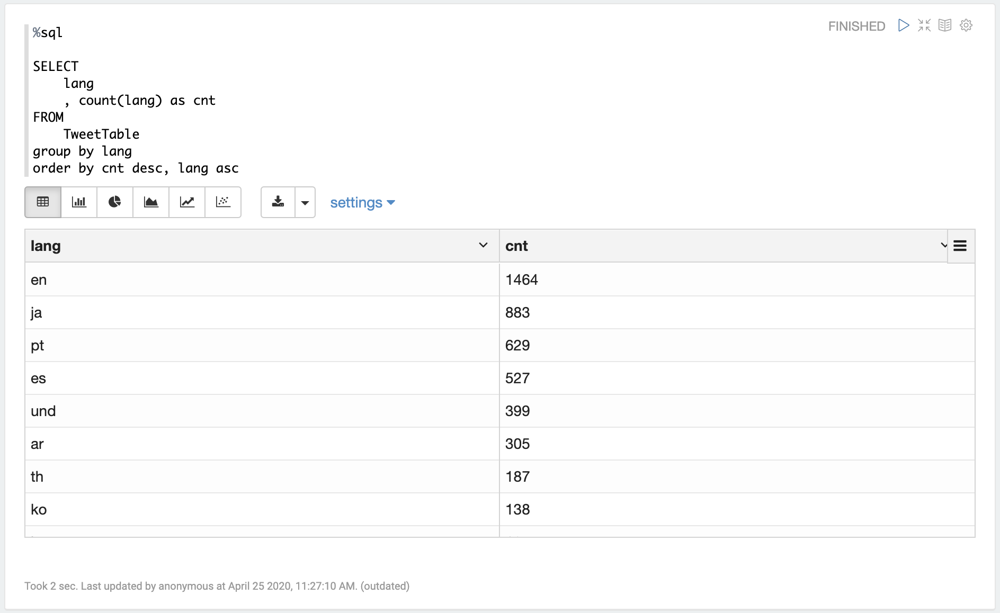

In [29]:
Image('./capture/streaming_23.png')

-----
   

In [ ]:
%sql

SELECT
    text
FROM
    TweetTable
where
    true
and lang = 'ko'

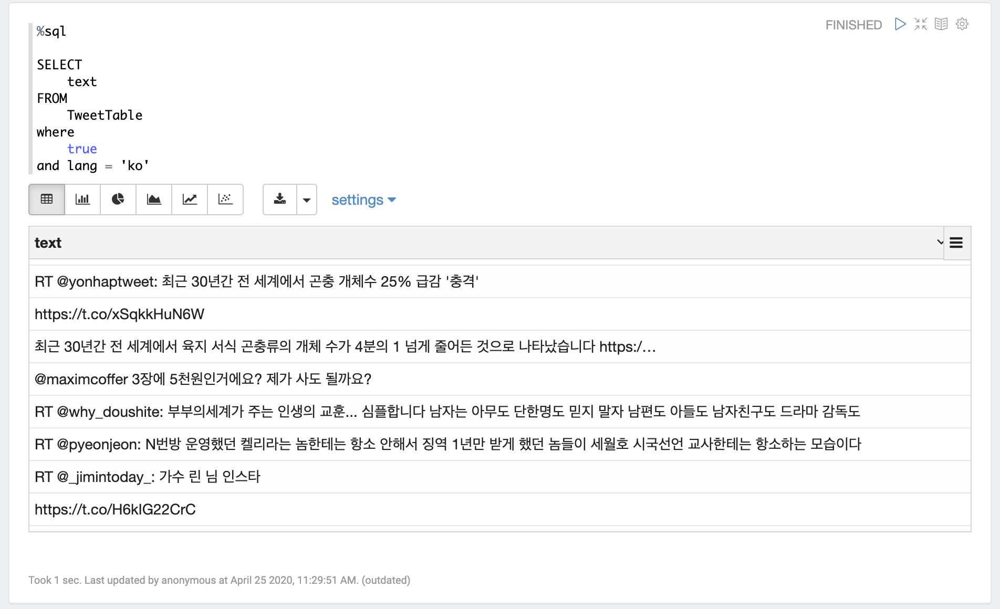

In [30]:
Image('./capture/streaming_24.png')

----
   

In [ ]:
%sql

SELECT
    replace(text, '\n',' ') as text
FROM
    TweetTable
where
    true
and lang = 'ko'
and text like '%BTS%'

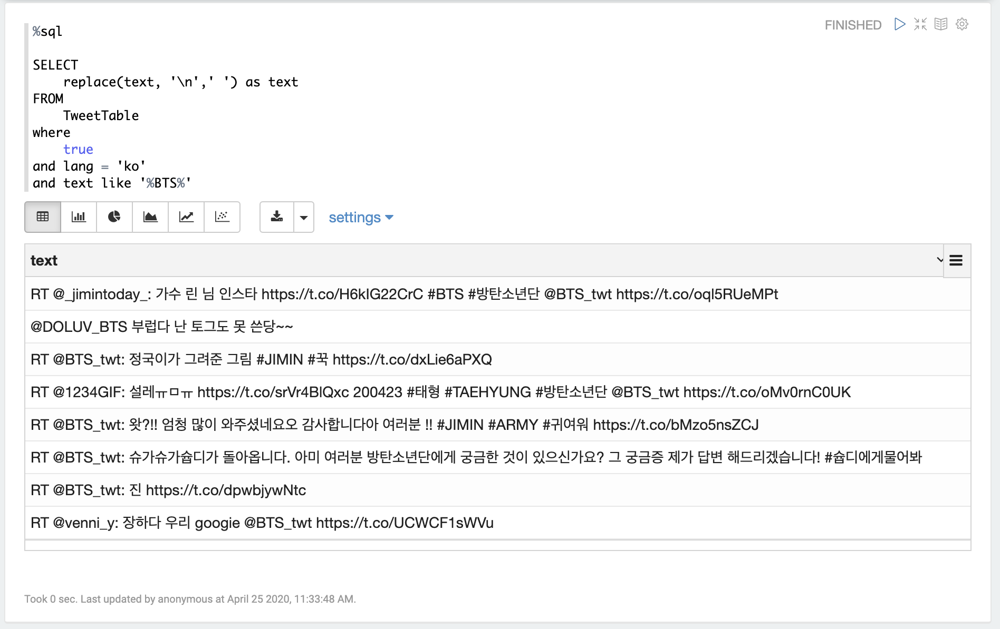

In [31]:
Image('./capture/streaming_25.png')

----
    


In [ ]:
%sql

SELECT
    lang
    , count(lang)
FROM
    TweetTable
where 
    text like '%BTS%'
group by lang

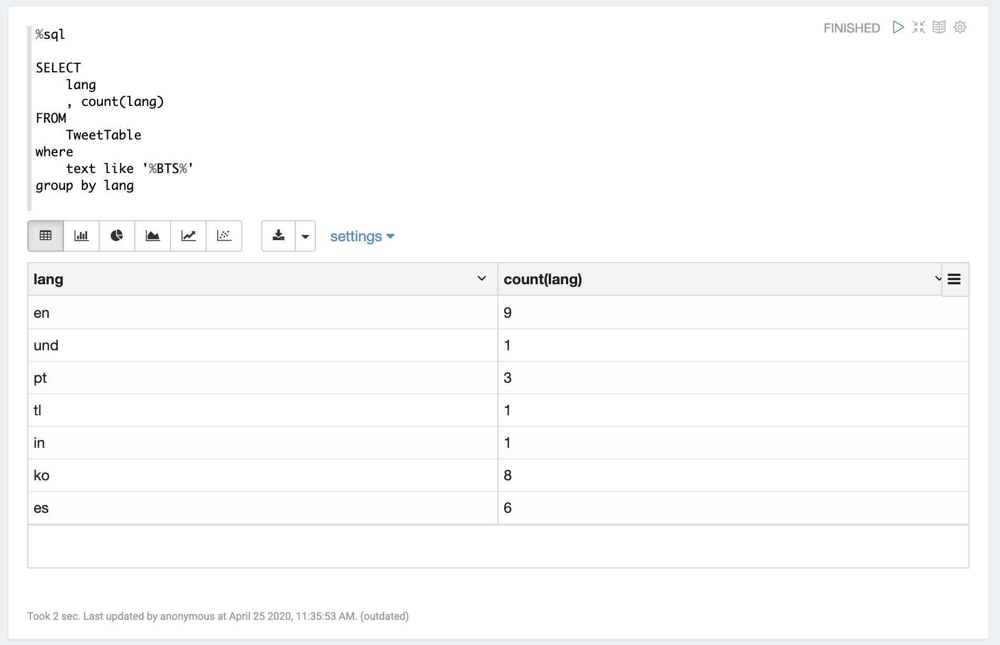

In [32]:
Image('./capture/streaming_26.png')

-----



In [ ]:
%sql

SELECT
    lang
    , count(lang)
    , collect_list(replace(text,'\n',' ')) as text
    , min(replace(text,'\n',' ')) as text
FROM
    TweetTable
where 
    text like '%BTS%'
group by lang

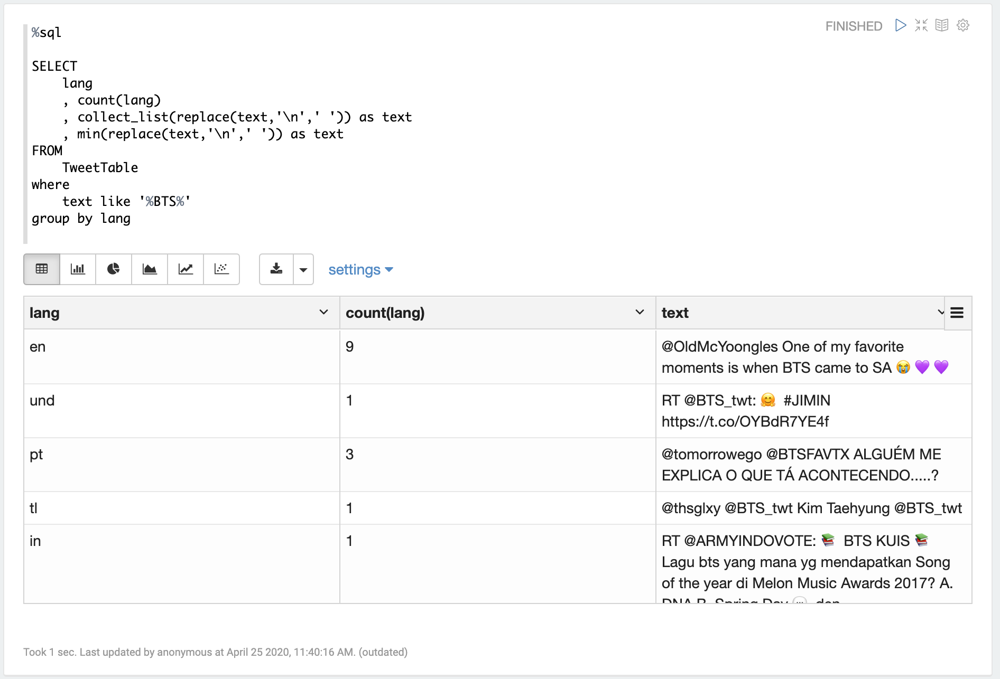

In [33]:
Image('./capture/streaming_27.png')

-----
### create TempView 
 - replace 적용


In [ ]:
val tweetTable2 = tweetTable.withColumn("text", regexp_replace($"text", "\n"," "))
tweetTable2.createOrReplaceTempView("tweetTable2")

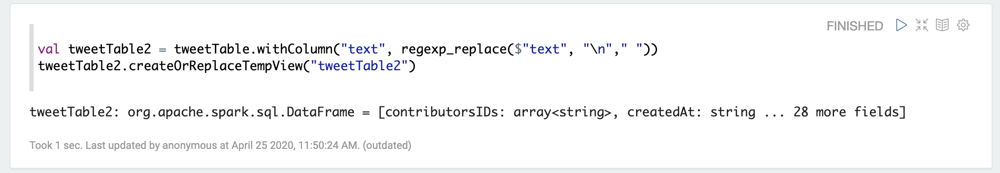

In [36]:
Image('./capture/streaming_28.png')

In [ ]:
%sql

SELECT
    lang
    , count(lang) as cnt
    , collect_list (text)
    , min (text) as text
FROM
    tweetTable2
where 
    text like '%BTS%'
group by lang
order by cnt desc

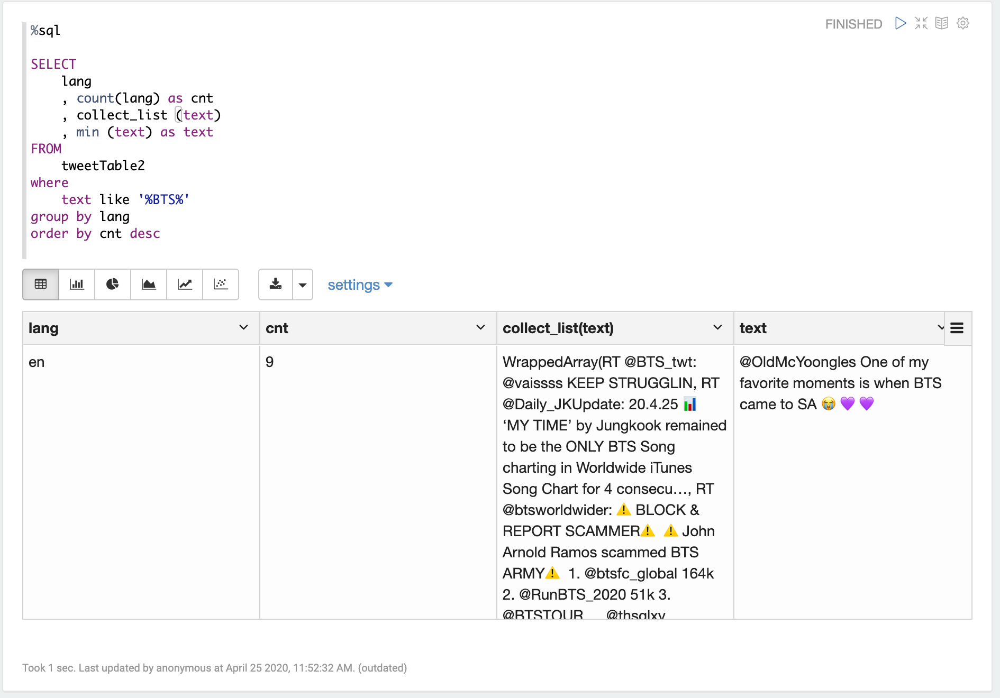

In [37]:
Image('./capture/streaming_29.png')

-----


In [ ]:
%sql

SELECT
    lang
    , count(lang) as cnt
FROM
    tweetTable2
where 
    true
group by lang
order by cnt desc

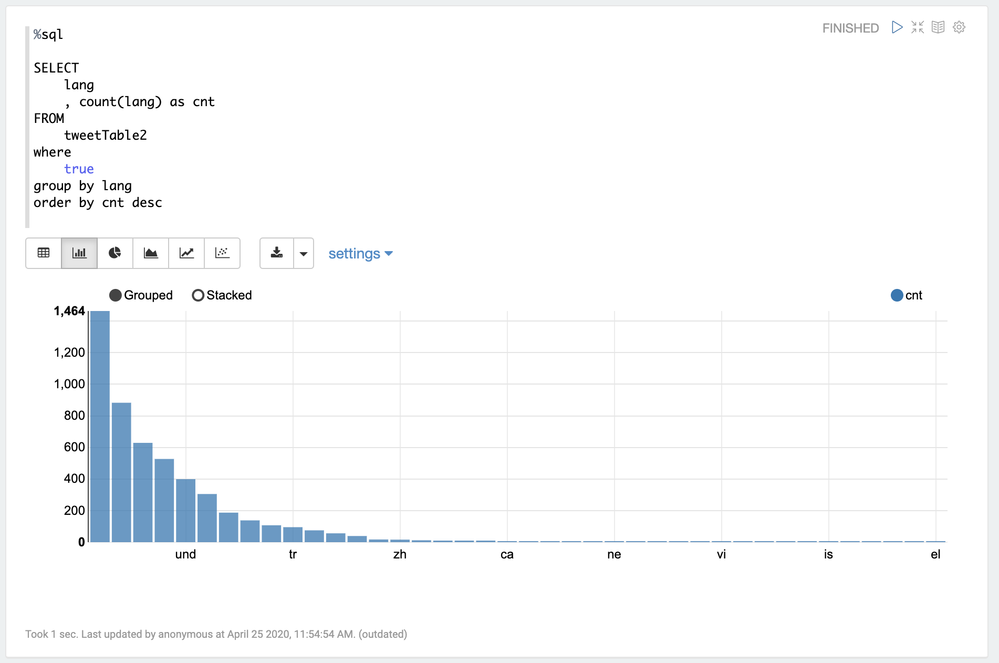

In [38]:
Image('./capture/streaming_30.png')

---- 
#### train.scala file

### Train
- utils 수정



In [ ]:
object Utils extends Serializable {

    import org.apache.spark.mllib.linalg.Vector
    import org.apache.spark.mllib.feature.HashingTF
    import twitter4j.auth.OAuthAuthorization
    import twitter4j.conf.ConfigurationBuilder

 def getAuth = {   
    //--트위터 계정 + 트위터 App (with Consumer Key and Access Token) 필요....
    val Array(consumerKey, consumerSecret, accessToken, accessTokenSecret) = Array("edgWhFgM9GML1TfA7hvzALTE9", "Jssdq2Kt1RDR3P0hG0GvpFvtjMg0JkG7LMR8qsq3ZhW8Wv9OVS", "168871039-RZ0pUTk1Ixzju4Dv0hmr6w1b0Mt7shlvHLnClqaO", "cICFbap5aoOQW2WB7Jpd0HwKL1viFv5BCg9pM8UMbWTkB")

    val builder: ConfigurationBuilder = new ConfigurationBuilder()
    builder.setOAuthConsumerKey(consumerKey);
    builder.setOAuthConsumerSecret(consumerSecret);
    builder.setOAuthAccessToken(accessToken);
    builder.setOAuthAccessTokenSecret(accessTokenSecret);
    Some(new OAuthAuthorization(builder.build()))
  }

  /**
   * Create feature vectors by turning each tweet into bigrams of characters (an n-gram model)
   * and then hashing those to a length-1000 feature vector that we can pass to MLlib.
   * This is a common way to decrease the number of features in a model while still
   * getting excellent accuracy (otherwise every pair of Unicode characters would
   * potentially be a feature).
   */
//   val numFeatures = 1000
//   val tf = new HashingTF(numFeatures)

  def featurize(s: String): Vector = {
    // tf.transform(s.sliding(2).toSeq)  //--transform()....Transforms the input document into a sparse term frequency vector.
    val numFeatures = 1000
    new HashingTF(numFeatures).transform(s.sliding(2).toSeq)
  }
}

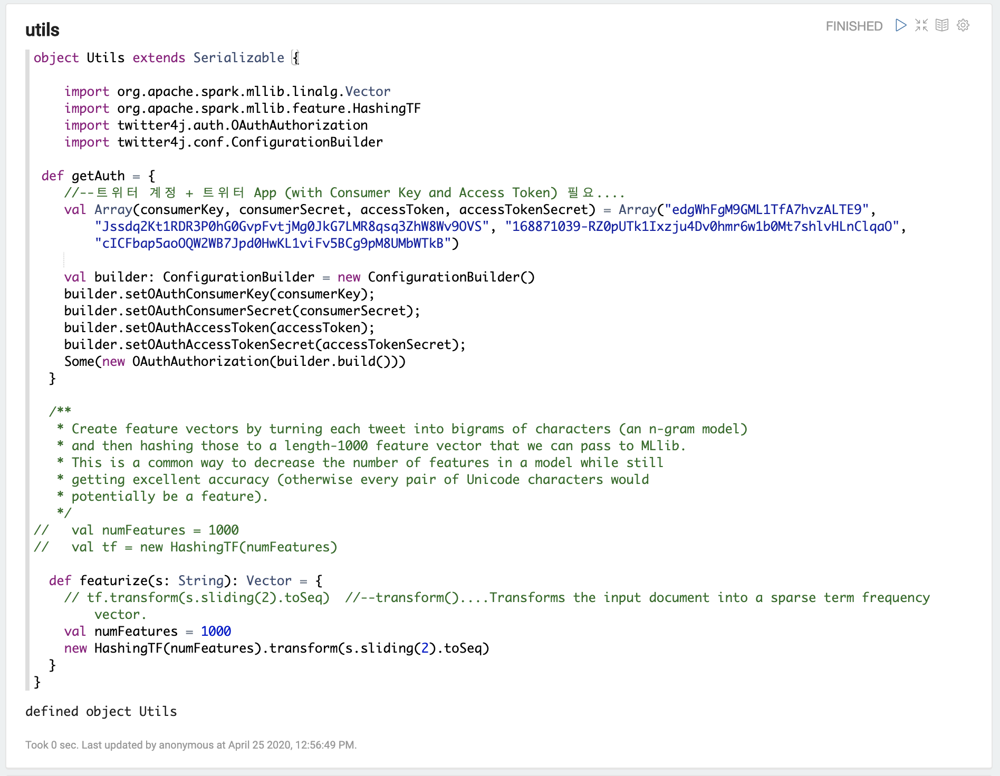

In [42]:
Image('./capture/streaming_31.png')

-----

### Train

In [ ]:
import com.google.gson.{GsonBuilder, JsonParser}
import org.apache.spark.mllib.clustering.KMeans
import org.apache.spark.{SparkConf, SparkContext}
import org.apache.spark.sql.SparkSession
import org.apache.spark.mllib.linalg.Vector
import org.apache.spark.rdd.RDD

//--JSON 처리를 위한 관련 객체 생성....
val jsonParser = new JsonParser()
val gson = new GsonBuilder().setPrettyPrinting().create()


//--트윗 수집 디렉토리 경로, 모델 저장 디렉토리 경로(머신러닝), 클러스터 개수(머신러닝), 반복 회수(머신러닝) 설정....
val Array(tweetInput, outputModelDir, numClusters, numIterations) 
  = Array("hdfs://hadoop-master-01:9000/kikang/data/twitter" + "/tweets_*/part-*", "hdfs://hadoop-master-01:9000/kikang/data/twitter_kmeans" + "/model", "100", "50")

//--Spark SQL로 JSON 파일 읽은 후 캐시.... => 결과는 Dataset....
val tweetTable = spark.read.json(tweetInput).cache()
//-- 캐시된 Dataset으로 Temp View 생성....
tweetTable.createOrReplaceTempView("tweetTable")

//--모델 학습 + 저장....
println(">>>> ----------- Training the Model and Persist it -----------")
val texts = spark.sql("SELECT text from tweetTable").map(_.toString)    
val vectors = texts.map(Utils.featurize)(org.apache.spark.sql.Encoders.kryo[Vector]).rdd.cache()  //--Cache the vectors RDD since it will be used for all the KMeans iterations.
vectors.setName("vectorsRDD")
vectors.count()  //--Calls an action on the RDD to populate the vectors cache.
val model = KMeans.train(vectors, numClusters.toInt, numIterations.toInt, "k-means||", 11L)    //--모델 학습....'initializationMode' => The initialization algorithm. This can either be "random" or "k-means||". (default: "k-means||")
sc.makeRDD(model.clusterCenters, numClusters.toInt).saveAsObjectFile(outputModelDir)  //--모델 저장....Vector 객체파일로 저장....
model.save(sc, outputModelDir + "_save")  //--모델 저장....1)human-readable (JSON) model metadata to path/metadata/, 2)Parquet formatted data to path/data/

//--모델 적용.... => 트윗 Text 클러스터링....
//-- => user.lang 필드가 없어졌음....
//  val some_tweets = spark.sql("SELECT user.lang, text from tweetTable LIMIT 100").rdd
val some_tweets = spark.sql("SELECT lang, text from tweetTable LIMIT 100").rdd
println(">>>> ----------- Example Tweets from the Clusters -----------")
for (i <- 0 until numClusters.toInt) {
  println(s"\n>>>> CLUSTER $i:")
  some_tweets.foreach { row =>
    if (model.predict(Utils.featurize(row.getString(1))) == i) {  //--predict(point: Vector): Int....Returns the cluster index that a given point belongs to.
      //println(s">>>> row.getString(0) : ${row.getString(0)}")
      //println(s">>>> row.getString(1) : ${row.getString(1)}")
      println(row)
    }
  }
}
println(s"\n")

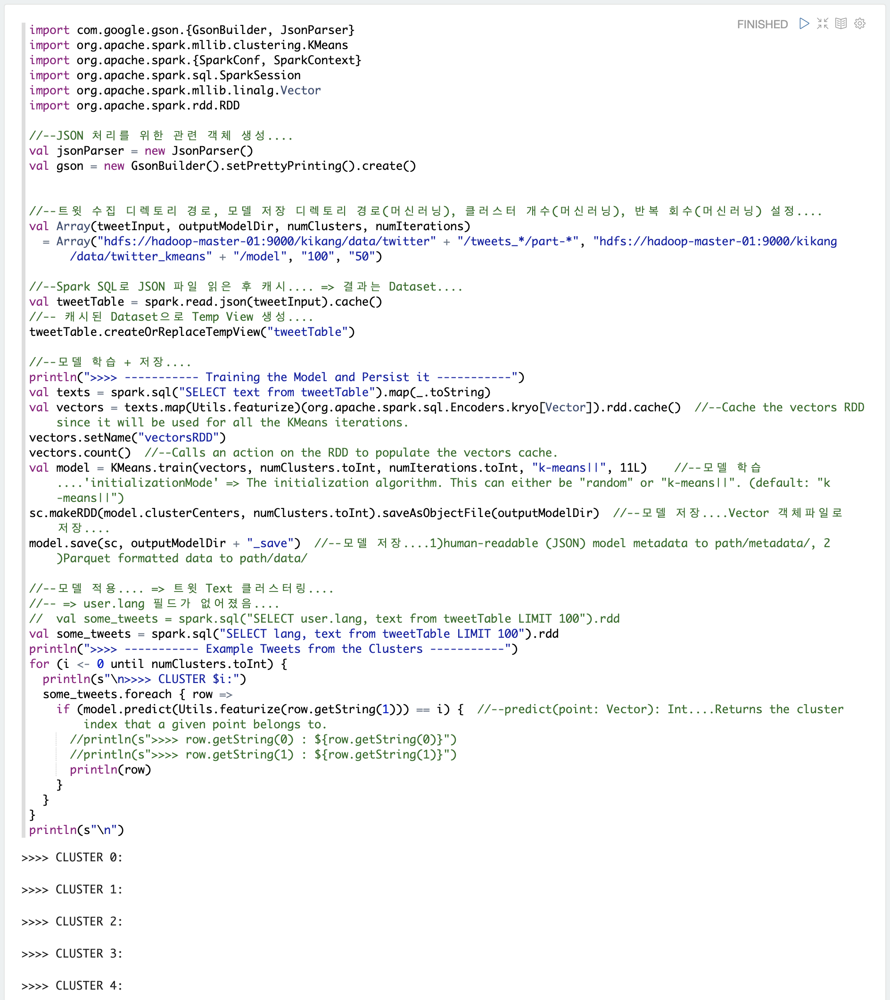

In [43]:
Image('./capture/streaming_32.png')

-----

#### 내용 확인

 - hadoop-master-01:8188
 
 -> Applications
 
 -> ApplicationMaster
 
 -> Description : foreach at ~ 
 
 -> stdout

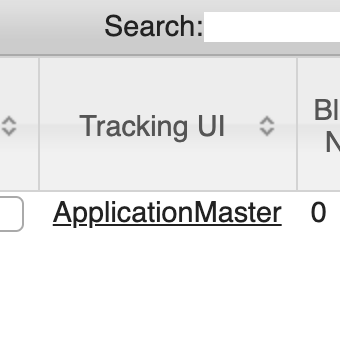

In [47]:
Image('./capture/streaming_35.png')

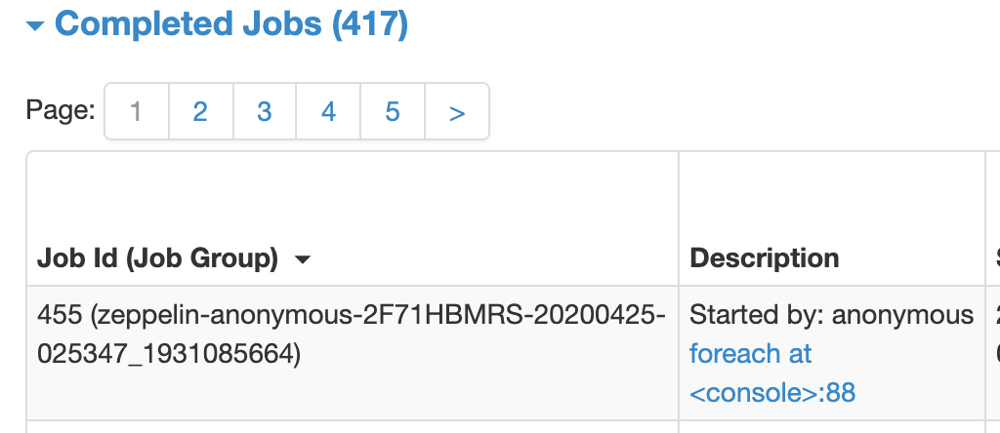

In [48]:
Image('./capture/streaming_36.png')

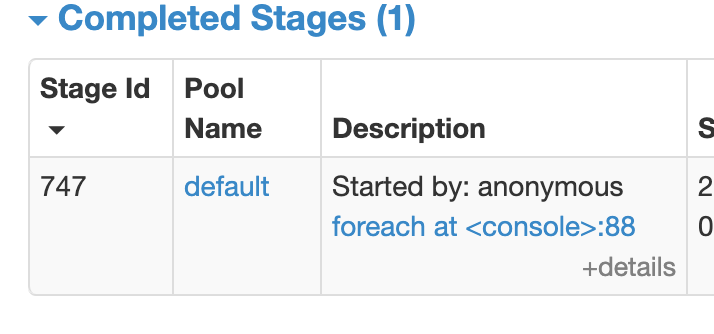

In [49]:
Image('./capture/streaming_37.png')

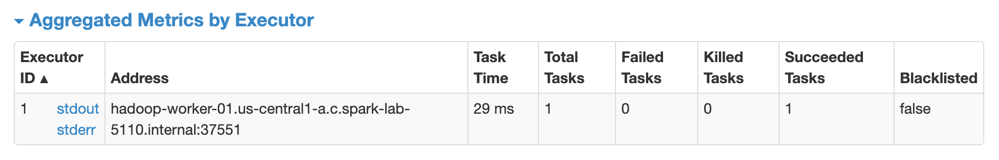

In [50]:
Image('./capture/streaming_38.png')

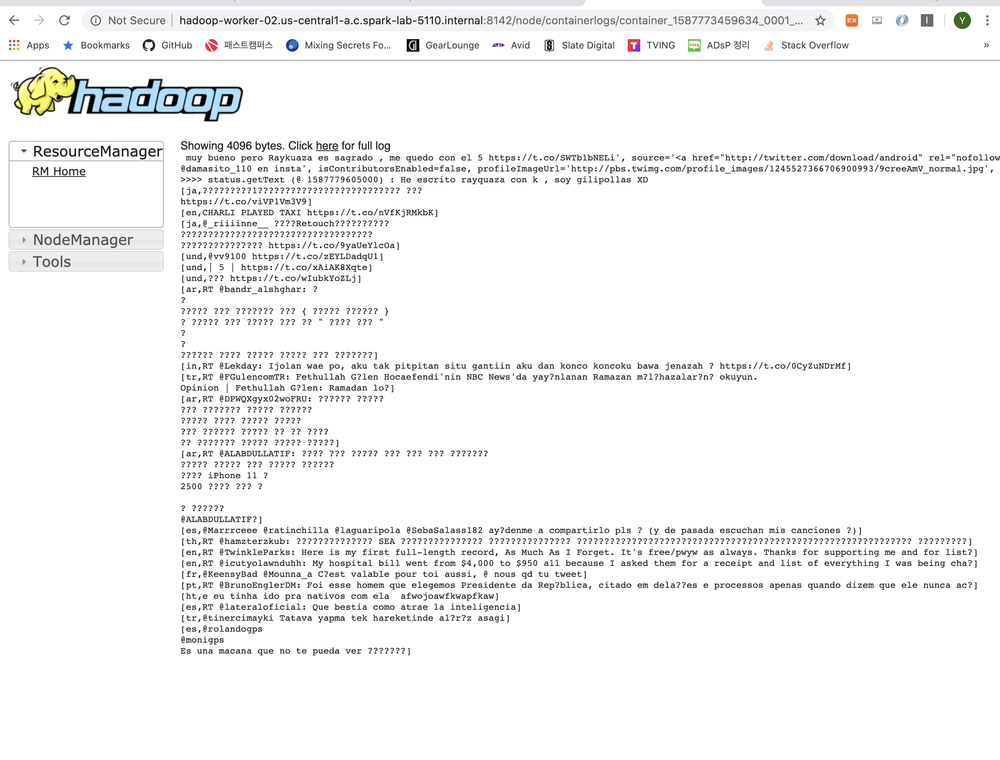

In [45]:
Image('./capture/streaming_33.png')

---------
#### Train 마지막 부분 수정



In [ ]:
//--모델 적용.... => 트윗 Text 클러스터링....
//-- => user.lang 필드가 없어졌음....
//  val some_tweets = spark.sql("SELECT user.lang, text from tweetTable LIMIT 100").rdd
val some_tweets = spark.sql("SELECT lang, text from tweetTable LIMIT 100").rdd
println(">>>> ----------- Example Tweets from the Clusters -----------")
for (i <- 0 until numClusters.toInt) {

  println(s"\n>>>> CLUSTER $i:")
  some_tweets.foreach { row =>
    if (model.predict(Utils.featurize(row.getString(1))) == i) {  //--predict(point: Vector): Int....Returns the cluster index that a given point belongs to.
      //println(s">>>> row.getString(0) : ${row.getString(0)}")
      //println(s">>>> row.getString(1) : ${row.getString(1)}")
      println(s"\n>>>> CLUSTER $i: $row")
    }
  }

  val some_tweets_filter = some_tweets.filter{ row => model.predict(Utils.featurize(row.getString(1))) == i }
    some_tweets_filter.collect().foreach(x => println(s"\t>>>> $x"))

}
println(s"\n")

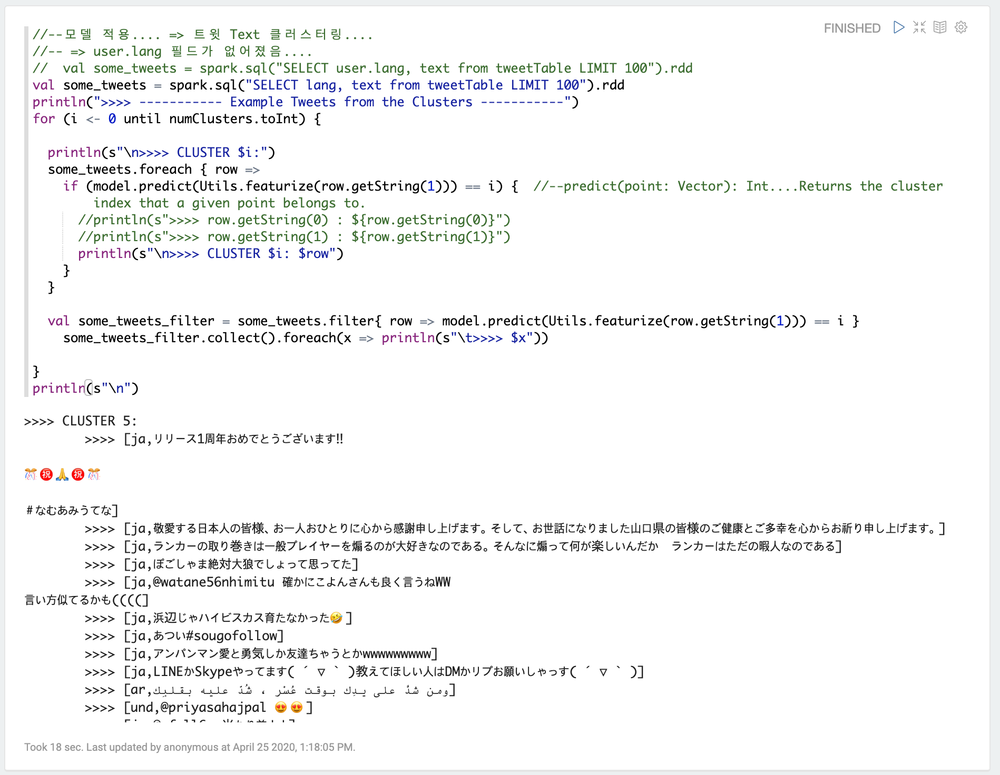

In [46]:
Image('./capture/streaming_34.png')